## Using vectorization to generate features

In [1]:
import pandas as pd
import spacy
import umap
import numpy as np

from io import BytesIO
from PIL import Image
import base64

from bokeh.plotting import figure, show, output_notebook
from bokeh.models import HoverTool, ColumnDataSource, CategoricalColorMapper
from bokeh.palettes import Spectral10, Category10
from pathlib import Path

import sys
sys.path.append('..')
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline
%load_ext autoreload
%autoreload 2

In [2]:
from ml_editor.data_processing import format_raw_df, get_split_by_author, get_normalized_series
from ml_editor.data_processing import add_text_features_to_df
from ml_editor.data_visualization import plot_embeddings

In [3]:
df = pd.read_csv(Path('../data/writers.csv'))
df = format_raw_df(df.copy())

train_author, test_author = get_split_by_author(df[df['is_question']])

questions = train_author[train_author['is_question']]
raw_text = questions['body_text']
sent_labels = questions['AcceptedAnswerId'].notna()

Load a model, and disable pipeline unnecessary for our task

In [4]:
nlp = spacy.load('en_core_web_md', disable=['parser', 'ner', 'tagger'])

Get the vector for each of our questions. 
By default, the vector returned is the average of all vectors in the sentence

In [9]:
spacy_emb = train_author[train_author['is_question']]['body_text'].apply(lambda x: nlp(x).vector)
embeddings = np.vstack(spacy_emb)

In [8]:
umap_embedder = umap.UMAP()
umap_emb = umap_embedder.fit_transform(embeddings)

### Interactive plot
Now we use bokeh to explore embeddings interactively.

In [13]:
from bokeh.models import ColumnDataSource

In [16]:
output_notebook()

def get_interactive_umap_embeddings_plot(umap_vectors, labels, text, legends, tooltip_label=None):
    if not tooltip_label:
        print('Using standard label')
        tooltip_label = labels
    w2v_df = pd.DataFrame(umap_vectors, columns=('x', 'y'))
    print(len(w2v_df))
    w2v_df['label'] = [str(x) for x in labels]
    w2v_df['tooltip_label'] = [str(x) for x in tooltip_label]
    w2v_df['text'] = list(text)
    w2v_df['legends'] = ['Answered' if el else 'Unanswered' for el in list(legends)]
    datasource = ColumnDataSource(w2v_df)
    
    color_mapping = CategoricalColorMapper(factors=['True', 'False'], palette=['#1f77b4', '#ff7f0e'])
    
    TOOLTIPS = [
        ('text', '@text'),
        ('got_answer', '@tooltip_label')
    ]
    hover = HoverTool(tooltips=TOOLTIPS)
    hover.attachment = 'right'
    
    plot_figure = figure(title='UMAP projection of questions',
                        plot_width=600,
                        plot_height=400,
                        tools=('pan', 'wheel_zoom', 'reset', 'box_zoom', 'undo'))
    plot_figure.add_tools(hover)
    
    plot_figure.circle('x',
                      'y',
                      source=datasource,
                      color=dict(field='label', transform=color_mapping),
                      legend='legends',
                      line_alpha=0,
                      fill_alpha=0.4,
                      size=5
                      )
    return plot_figure

Loading BokehJS ...

In [17]:
plot_figure = get_interactive_umap_embeddings_plot(umap_emb, sent_labels, raw_text, legends=sent_labels)
show(plot_figure)

Using standard label
5495


In [18]:
# Fill empty rows to allow search to still perform
df['body_text_question'].fillna("", inplace=True)

def show_question_features_containing(text):
    return df[df['body_text_question'].str.contains(text)][['body_text', 'CommentCount',
                                                           'body_text_question',
                                                           'Score_question',
                                                           'AcceptedAnswerId_question']]

In [21]:
df2 = show_question_features_containing("I'm an amateur writer")

### Potential features
Looking through the embeddings and associated rows of data, it seems like a few features were predictive of the target class of a question.
* Question length: very short questions tended not to get answers
* Presence of question mark: the absence of a question mark seemed to lower the chance of an answer
* Vocabulary associated with a clear question (action verbs, etc...): unanswered questions seemed to be missing those

In [5]:
df['action_verb'] = (df['body_text'].str.contains('can', regex=False)
                    | df['body_text'].str.contains('What', regex=False)
                    | df['body_text'].str.contains('should', regex=False))
df['question_mark'] = df['body_text'].str.contains('?', regex=False)
df['text_len'] = df['body_text'].str.len()

In [26]:
df['action_verb'].value_counts()

True     23248
False    10402
Name: action_verb, dtype: int64

In [27]:
df['question_mark'].value_counts()

False    18540
True     15110
Name: question_mark, dtype: int64

Since we already have a measure of text length, let's simply preprocess it by normalizing it. Because we added features to df itself, and not the train split, we recreate a train split here.

In [6]:
df['norm_text_len'] = get_normalized_series(df, 'text_len')

In [7]:
train_author, test_author = get_split_by_author(df[df['is_question']])

Now that we've added features to our model, we append the generated features to the existing vectors to create new embeddings, and visualize the embedding space again. Our hope is that as we add more features, the embeddings will be more separated.

In [10]:
vectorized_features = np.append(np.array(embeddings), 
                                train_author[train_author['is_question']][['action_verb','question_mark','norm_text_len']], 1)

In [11]:
umap_embedder = umap.UMAP()
umap_features = umap_embedder.fit_transform(vectorized_features)

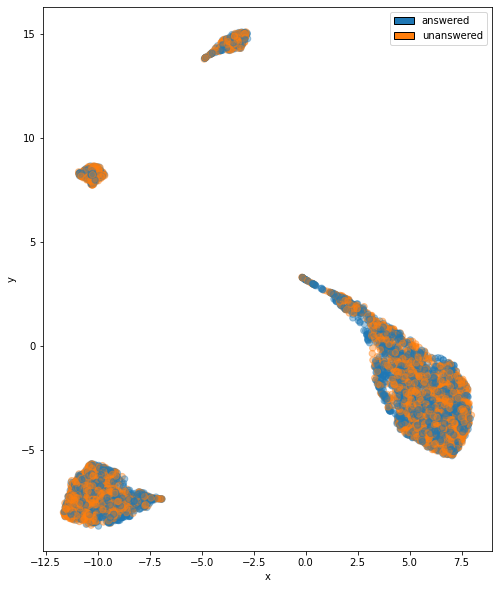

In [32]:
plot_embeddings(umap_features, sent_labels)

We can see that the features seem to have contributed to shaping the landscape of our dataset, in particular, it seems like we have separated some clusters containing a majority of unanswered questions. 

Let's go through the dataset once more and see what other features we can come up with. 

In [33]:
plot_figure = get_interactive_umap_embeddings_plot(umap_features, sent_labels, raw_text, legends=sent_labels)
show(plot_figure)

Using standard label
5495


Let's add title into the information as well:

In [12]:
df['full_text'] = df['Title'].str.cat(df['body_text'], sep=' ', na_rep='')

We recompute the features described above in the same manner, but using the full text this time

In [13]:
df = add_text_features_to_df(df.loc[df['is_question']].copy())

In [14]:
train_author, test_author = get_split_by_author(df[df['is_question']])
train_labels = train_author['AcceptedAnswerId'].notna()
train_author['vectors'] = train_author['full_text'].apply(lambda x: nlp(x).vector)

In [15]:
vectorized_features = np.append(
    np.vstack(train_author['vectors']),
    train_author[
        [
            'action_verb_full',
            'question_mark_full',
            'norm_text_len',
            'language_question',
        ]
    ],
    1,
)

Let's visualize the embeddings once more

In [16]:
umap_embedder = umap.UMAP()
umap_features = umap_embedder.fit_transform(vectorized_features)

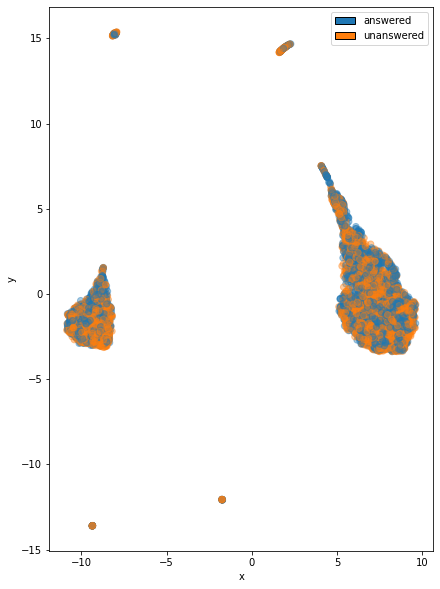

In [39]:
plot_embeddings(umap_features, train_labels)

In [40]:
plot_figure = get_interactive_umap_embeddings_plot(umap_features, sent_labels, raw_text, legends=sent_labels)

Using standard label
5495


### Plotly for feature exploration
We can also display using plotly instead of bokeh. It has the advantage of being more interactive and easier to set up. The only thing I found fiddly was that you need to wrap long lines, which you can do by inserting `<br>`

In [36]:
import plotly.io as pio
pio.renderers.default = 'notebook'

In [79]:
umap_df = pd.DataFrame(umap_features, columns=('x', 'y'))
umap_df['label'] = [str(x) for x in sent_labels]
umap_df['text'] = [str(x) for x in raw_text]
umap_df['Outcome'] = ['Answered' if el else 'Unanswered' for el in list(sent_labels)]

In [76]:
def break_long_strings(text):
    n = 10
    word_list = text.split(' ')
    chunked = '<br>'.join([' '.join(word_list[i * n:(i + 1) * n]) for i in range((len(word_list) + n - 1) // n )]) 
    return chunked

In [80]:
umap_df['QuestionText'] = umap_df['text'].apply(break_long_strings)

In [81]:
import plotly.express as px
fig = px.scatter(umap_df, x='x', y='y', color='Outcome', hover_data=['QuestionText'])
fig.show()